In [1]:
import matplotlib
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import RobustScaler
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from pickle import dump
from sklearn.metrics import  confusion_matrix
from sklearn.metrics import classification_report

In [2]:
df = pd.read_csv('Subdataset1.csv')

# pre processsing
df = df.drop(['S_PU1', 'S_PU3', 'F_PU3', 'F_PU5', 'S_PU5', 'F_PU9', 'S_PU9', 'F_PU11', 'S_PU11', 'DATETIME'], 1)

C:\Users\Apoorv\AppData\Local\Temp\ipykernel_29880\1284286840.py:4: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  df = df.drop(['S_PU1', 'S_PU3', 'F_PU3', 'F_PU5', 'S_PU5', 'F_PU9', 'S_PU9', 'F_PU11', 'S_PU11', 'DATETIME'], 1)


In [3]:
dataset = df
train_size = int(len(dataset) * 0.8)
test_size = int(len(dataset) * 0.2)

train, test = dataset.iloc[0:train_size], dataset.iloc[train_size:len(dataset)]
train.columns = dataset.columns
test.columns = dataset.columns
train_cp, test_cp = train, test
print('Train shape: ', train.shape)
print('Test shape: ', test.shape)

Train shape:  (7008, 34)
Test shape:  (1753, 34)


In [4]:
trans = RobustScaler()

#train data standardisation
train = trans.fit_transform(train)
train = pd.DataFrame(train)

#test data
test = trans.transform(test)
test = pd.DataFrame(test)
dump(trans, open('trans.pkl', 'wb'))

In [5]:
def split_series(series, n_past, n_future):
  #
  # n_past ==> no of past observations
  #
  # n_future ==> no of future observations 
  #
    X, y = list(), list()
    for window_start in range(len(series)):
        past_end = window_start + n_past
        future_end = past_end + n_future
        if future_end > len(series):
            break
    # slicing the past and future parts of the window
        past, future = series[window_start:past_end, :], series[past_end:future_end, :]
        X.append(past)
        y.append(future)
    return np.array(X), np.array(y)

In [6]:
n_past = 12
n_future = 1
n_features = 34

In [7]:
X_train, y_train = split_series(train.values,n_past, n_future)
print(X_train.shape, y_train.shape)
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1],n_features))
y_train = y_train.reshape((y_train.shape[0], y_train.shape[1], n_features))
X_test, y_test = split_series(test.values,n_past, n_future)
print(X_test.shape, y_test.shape)
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1],n_features))
y_test = y_test.reshape((y_test.shape[0], y_test.shape[1], n_features))

(6996, 12, 34) (6996, 1, 34)
(1741, 12, 34) (1741, 1, 34)


In [8]:
encoder_inputs = tf.keras.layers.Input(shape=(n_past, n_features))
encoder_l1 = tf.keras.layers.LSTM(50,return_sequences = True, return_state=True, recurrent_regularizer=tf.keras.regularizers.l2(l=0.001),kernel_regularizer=tf.keras.regularizers.l2(l=0.001))
encoder_outputs1 = encoder_l1(encoder_inputs)
encoder_states1 = encoder_outputs1[1:]
encoder_l2 = tf.keras.layers.LSTM(50, return_state=True, recurrent_regularizer=tf.keras.regularizers.l2(l=0.001),kernel_regularizer=tf.keras.regularizers.l2(l=0.001))
encoder_outputs2 = encoder_l2(encoder_outputs1[0])
encoder_states2 = encoder_outputs2[1:]
#
decoder_inputs = tf.keras.layers.RepeatVector(n_future)(encoder_outputs2[0])
#
decoder_l1 = tf.keras.layers.LSTM(50, return_sequences=True, recurrent_regularizer=tf.keras.regularizers.l2(l=0.001),kernel_regularizer=tf.keras.regularizers.l2(l=0.001))(decoder_inputs,initial_state = encoder_states1)
decoder_l2 = tf.keras.layers.LSTM(50, return_sequences=True, recurrent_regularizer=tf.keras.regularizers.l2(l=0.001),kernel_regularizer=tf.keras.regularizers.l2(l=0.001))(decoder_l1,initial_state = encoder_states2)
decoder_outputs2 = tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(n_features))(decoder_l2)
#
model_e1d1 = tf.keras.models.Model(encoder_inputs,decoder_outputs2)
#
model_e1d1.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 12, 34)]     0           []                               
                                                                                                  
 lstm (LSTM)                    [(None, 12, 50),     17000       ['input_1[0][0]']                
                                 (None, 50),                                                      
                                 (None, 50)]                                                      
                                                                                                  
 lstm_1 (LSTM)                  [(None, 50),         20200       ['lstm[0][0]']                   
                                 (None, 50),                                                  

In [9]:
reduce_lr = tf.keras.callbacks.LearningRateScheduler(lambda x: 1e-2 * 0.90 ** x)
model_e1d1.compile(optimizer=tf.keras.optimizers.Adam(), loss=tf.keras.losses.Huber())
history_e1d1=model_e1d1.fit(X_train,y_train,epochs=60,validation_data=(X_test,y_test),batch_size=128,callbacks=[reduce_lr])


Epoch 1/60
55/55 [==============================] - 9s 45ms/step - loss: 0.3807 - val_loss: 0.3025 - lr: 0.0100
Epoch 2/60
55/55 [==============================] - 1s 13ms/step - loss: 0.2938 - val_loss: 0.2823 - lr: 0.0090
Epoch 3/60
55/55 [==============================] - 1s 14ms/step - loss: 0.2695 - val_loss: 0.2540 - lr: 0.0081
Epoch 4/60
55/55 [==============================] - 1s 16ms/step - loss: 0.2377 - val_loss: 0.2261 - lr: 0.0073
Epoch 5/60
55/55 [==============================] - 1s 16ms/step - loss: 0.2174 - val_loss: 0.2055 - lr: 0.0066
Epoch 6/60
55/55 [==============================] - 1s 16ms/step - loss: 0.1882 - val_loss: 0.1766 - lr: 0.0059
Epoch 7/60
55/55 [==============================] - 1s 16ms/step - loss: 0.1562 - val_loss: 0.1413 - lr: 0.0053
Epoch 8/60
55/55 [==============================] - 1s 16ms/step - loss: 0.1378 - val_loss: 0.1292 - lr: 0.0048
Epoch 9/60
55/55 [==============================] - 1s 17ms/step - loss: 0.1274 - val_loss: 0.1250 - lr:

In [10]:
##Saving our Model

model_e1d1.save('keras_prob2.h5')
pred=model_e1d1.predict(X_test)

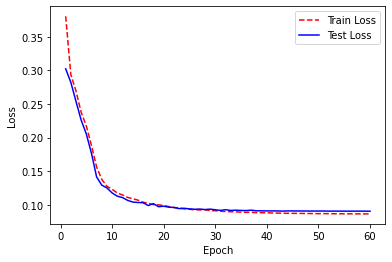

In [11]:
# Get training and test loss histories
training_loss = history_e1d1.history['loss']
test_loss = history_e1d1.history['val_loss']

# Create count of the number of epochs
epoch_count = range(1, len(training_loss) + 1)

# Visualize loss history
plt.plot(epoch_count, training_loss, 'r--')
plt.plot(epoch_count, test_loss, 'b-')
plt.legend(['Train Loss', 'Test Loss'])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.show();

In [12]:
pred_np = np.vstack(pred)
pred_df = pd.DataFrame(pred_np, columns=dataset.columns)


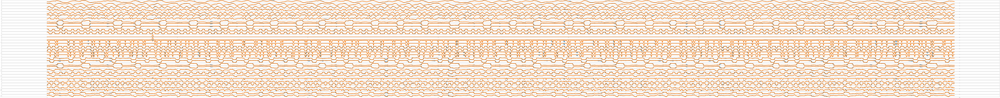

In [25]:
# visualizing the predicated vs the actual values

test.columns = dataset.columns

test_trim = test.iloc[n_past:].reset_index(drop=True)

fig, axes = plt.subplots(nrows=n_features, ncols=1)
i = 0
for col in dataset.columns:
    ax = pred_df[col].plot(ax=axes[i], use_index=True, figsize=(400,40), linewidth=10)
    test_trim[col].plot(ax=ax, figsize=(400,40), linewidth=10)
    i += 1

In [24]:
# visualize normal difference between pred and real values in a histogram

pred_np_tmp = pred_df.to_numpy()
pred_np_inv = trans.inverse_transform(pred_np_tmp)
pred_np = pred_np_inv

actual_np_tmp = test_trim.to_numpy()
actual_np_inv = trans.inverse_transform(actual_np_tmp)
actual_np = actual_np_inv
print('Compare scaled pred vs true')


print(np.abs(pred_np_tmp[0]-actual_np_tmp[0]))

print('Compare unscaled pred vs true')

print(np.abs(pred_np_inv[0]-actual_np_inv[0]))



dist_array=[]
for row in range(len(pred_np)):
    dist = np.linalg.norm(pred_np[row] - actual_np[row], axis=0)
    dist_array.append(dist)

Compare scaled pred vs true
[0.11580262 0.04950282 0.06157829 0.00619479 0.0603733  0.23149617
 0.11131175 0.08659061 0.00525863 0.02224906 0.03335914 0.05690467
 0.00736036 0.0113904  0.08752975 0.01367531 0.06305845 0.06028324
 0.10875544 0.00680953 0.06749046 0.1463543  0.0042399  0.08932542
 0.29851    0.06942771 0.30677931 0.08992097 0.01146941 0.03062367
 0.00518369 0.13119831 0.1328483  0.3221105 ]
Compare unscaled pred vs true
[2.45280862e-01 1.21332645e-01 7.22193718e-02 5.46741454e-03
 7.53285883e-02 5.88288302e-02 1.49891615e-01 1.55606079e+00
 5.08110042e-01 2.22491026e-02 1.13506698e+00 5.69046736e-02
 7.36035779e-03 1.13904038e-02 1.92642208e-01 1.36753321e-02
 2.24053383e+00 6.02832437e-02 2.03651426e-01 6.80947304e-03
 5.58922577e+00 1.46354318e-01 6.10347025e-05 8.80336760e-01
 8.66611480e-01 1.12900543e+00 8.85276796e-01 2.28767396e-01
 9.15470164e-02 6.04030613e-01 4.14810189e-02 5.94581606e-01
 9.87659457e-01 9.16458125e-01]


[0.12133265 0.0992794  0.07403326 0.08358908 0.23511362]
1741
1741
1741
1739
per_feature_thresh:  [2.45105833e-01 3.43228592e-01 1.89069251e-01 2.54091104e-01
 2.69285276e-01 7.42660165e-02 2.94921855e-01 3.14324188e+00
 1.22498903e+01 1.29439058e-01 5.69729924e+00 1.64127913e-01
 1.78472218e-02 1.68309706e-02 6.75914184e+00 1.41068712e-01
 7.21367884e+00 2.06085426e-01 4.54043603e+00 1.48783565e-01
 1.41504882e+01 1.84556755e-01 1.94174058e-03 1.71426860e+00
 1.01573372e+00 3.28169314e+00 1.01134046e+00 3.47491026e+00
 1.82461874e+00 4.29641708e+00 1.81081208e+00 2.65490516e+00
 1.66329757e+00 1.01237917e+00]


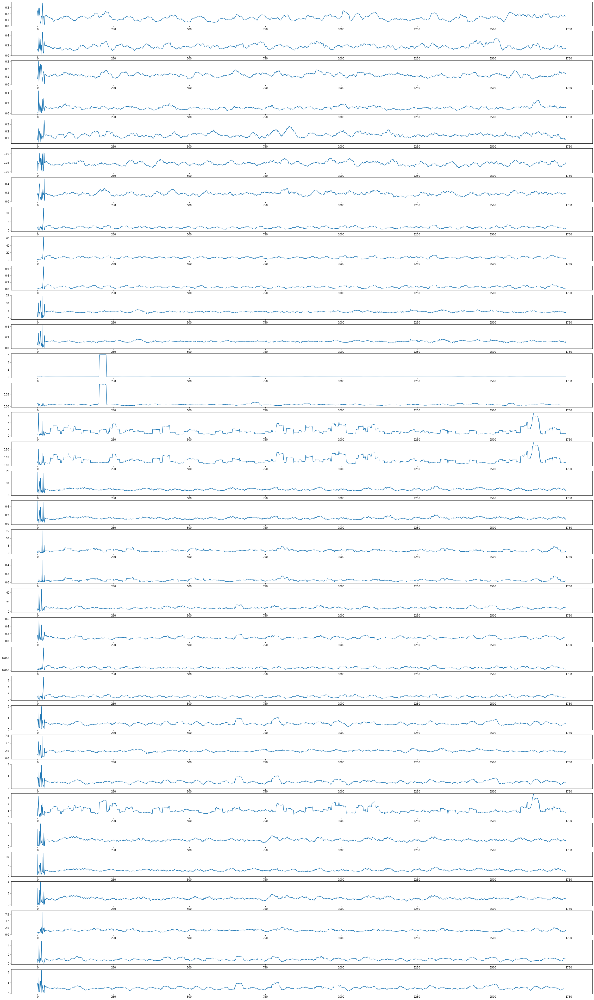

In [23]:
diff_pred_act = np.abs(np.subtract(pred_np, actual_np))
moving_avg = []

per_feature_diff_mean = np.mean(diff_pred_act, axis=0)
per_feature_diff_std = np.std(diff_pred_act, axis=0)


print(diff_pred_act[0:5,1])
print(len(diff_pred_act))

avg_sample_rate = 24

for ii in range(0, len(diff_pred_act)):
    avg_feature_data = np.zeros(n_features)
    for jj in range(0, n_features):
        if ii >= avg_sample_rate:
            avg_diff = sum(diff_pred_act[ii-avg_sample_rate:ii,jj])/avg_sample_rate
            avg_feature_data[jj] = avg_diff
        else:
            avg_feature_data[jj] = diff_pred_act[ii, jj]
            
    moving_avg.append(avg_feature_data)

print(len(moving_avg))   
data0 = np.array(moving_avg)
fig, axes = plt.subplots(nrows=n_features, ncols=1, figsize=(40,70))    
for ii in range(0, n_features):
    axes[ii].plot(data0[:,ii])
    
print(len(data0[:,ii]))

per_feature_thresh = np.zeros(n_features)
cutoff = int(len(diff_pred_act)*0.999)
print(cutoff)

for ii in range(0, n_features):
    
    data0[300:,ii].sort()
    per_feature_thresh[ii] = data0[cutoff,ii]
    

print('per_feature_thresh: ', per_feature_thresh)


In [20]:
# preparing subset2 data

# load data subset 2
df2 = pd.read_csv('Subdataset2.csv')

# pre processsing
df2 = df2.drop([' S_PU1', ' S_PU3', ' F_PU3', ' F_PU5', ' S_PU5', ' F_PU9', ' F_PU11', ' S_PU11', ' S_PU9', 'DATETIME'], 1)
df2.columns = df.columns

#test data 2
test2 = trans.transform(df2)
test2 = pd.DataFrame(test2)

#sampling into 3-d
X_test_2, y_test_2 = split_series(test2.values, n_past, n_future)
print(X_test_2.shape, y_test_2.shape)

X_test_2 = X_test_2.reshape((X_test_2.shape[0], X_test_2.shape[1],n_features))
y_test_2 = y_test_2.reshape((y_test_2.shape[0], y_test_2.shape[1], n_features))

#prediction
pred_test2=model_e1d1.predict(X_test_2)
print(pred_test2.shape)

#convert pred_test2 into df
pred_test2_np_tmp = np.vstack(pred_test2)
pred_test2_inv = trans.inverse_transform(pred_test2_np_tmp)
pred_test2_np = pred_test2_inv

pred_test2_df = pd.DataFrame(pred_test2_np, columns=df2.columns)
#pred_test2_df.info()

#visualisations for subset2 data
#test2_trim = test2.iloc[n_past:].reset_index(drop=True)
test2_trim = df2.iloc[n_past:].reset_index(drop=True) #<----------------------------------
test2_trim.columns = df2.columns
fig, axes = plt.subplots(nrows=n_features, ncols=1)
i = 0
for col in df2.columns:
    ax = pred_test2_df[col].plot(ax=axes[i], use_index=True, figsize=(400,40), linewidth=10)
    test2_trim[col].plot(ax=ax, figsize=(400,40), linewidth=10)
    i += 1
    
## We see vertical blue lines for attack  in the visualisation below

C:\Users\Apoorv\AppData\Local\Temp\ipykernel_29880\1114655200.py:7: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  df2 = df2.drop([' S_PU1', ' S_PU3', ' F_PU3', ' F_PU5', ' S_PU5', ' F_PU9', ' F_PU11', ' S_PU11', ' S_PU9', 'DATETIME'], 1)


(4165, 12, 34) (4165, 1, 34)
(4165, 1, 34)


4165


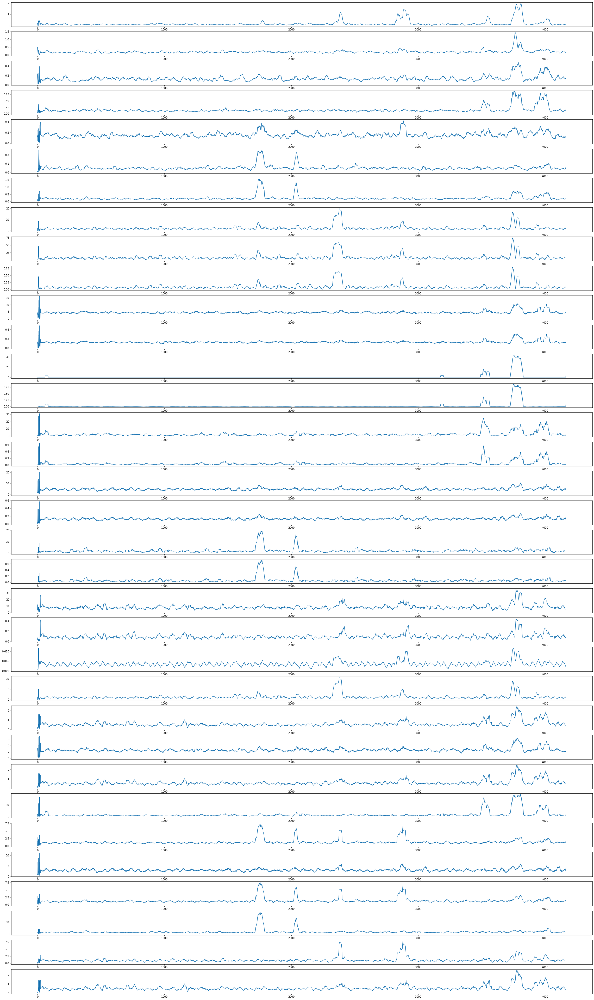

In [21]:
# visualizing the difference between predicted and actual data

pred_np2 = pred_test2_df.to_numpy()
actual_np2 = test2_trim.to_numpy()
dist_array2=[]
classification_array2=[]
moving_avg2=[]

threshold2 = 6

for row in range(len(pred_np2)):
    dist = np.abs(np.subtract(pred_np2[row], actual_np2[row]))   
    dist_array2.append(dist)
    
    if len(dist_array2)-avg_sample_rate >= 0:
        avg_dist = sum(dist_array2[len(dist_array2)-avg_sample_rate:len(dist_array2)])/avg_sample_rate
        moving_avg2.append(avg_dist)
    else:
        moving_avg2.append(dist)
    
    diff = np.sum(np.array(per_feature_thresh - moving_avg2[len(moving_avg2)-1]) <= 0, axis = 0)
    if diff > threshold2:
        classification_array2.append(-1)
    else:
        classification_array2.append(1)


window_size =12

for i in range(0, len(classification_array2),window_size) :
    block=[]
    if i + window_size>len(classification_array2):
        break
        
    for j in range(i , i+ window_size):
        
        if len(block)==0 or block[-1][0] != classification_array2[j]:
            
            block.append((classification_array2[j],j))
    
    if len(block)<=2:
        continue
    if block[2][1]-block[1][1]<12:
        for k in range(block[1][1],block[2][1]):
            classification_array2[k] = block[0][0]

    
data = np.array(moving_avg2)
fig, axes = plt.subplots(nrows=n_features, ncols=1, figsize=(40,70))    
for ii in range(0, n_features):
    axes[ii].plot(data[:,ii])
    
print(len(data[:,ii]))

#We see that the peaks are the attack in the plot below

In [22]:
##EVALUATING THE PERFORMANCE ON DATASET 2
#Preparing dataset2
# mark data as malicious or not

import sys
np.set_printoptions(threshold=sys.maxsize)
attack_start = ['13/09/20 23', '26/09/20 11', '09/10/20 09', '29/10/20 19', '26/11/20 17', '06/12/20 07', '14/12/20 15']
offset = [50, 24, 60, 94, 60, 94, 110]
df2_cp = pd.read_csv('Subdataset2.csv')
df2_cp = df2_cp.drop([' S_PU1', ' S_PU3', ' F_PU3', ' F_PU5', ' S_PU5', ' F_PU9', ' S_PU9'], 1)
df2_cp = df2_cp.iloc[n_past-1:]
print(len(df2_cp))
true_classification = np.ones(df2_cp.shape[0]-1)
for i in range(len(attack_start)):
    index = df2_cp[df2_cp['DATETIME'] == attack_start[i]].index.values
    i_cpy = index
    print(index, offset[i], index+offset[i])
    for j in range(offset[i]):
        true_classification[i_cpy+j] = -1
    
##RUNNING SOME ACCURACY CHECKS AND LOOKING AT THE CONFUSION MATRIX

print(classification_report(true_classification, classification_array2))
np.unique(true_classification,return_counts=True)
print('Confusion Matrix: \n', confusion_matrix(true_classification, classification_array2), "\n")

len(true_classification)


4166
[1727] 50 [1777]
[2027] 24 [2051]
[2337] 60 [2397]
[2827] 94 [2921]
[3497] 60 [3557]
[3727] 94 [3821]
[3927] 110 [4037]
              precision    recall  f1-score   support

        -1.0       0.84      0.97      0.90       492
         1.0       1.00      0.98      0.99      3673

    accuracy                           0.98      4165
   macro avg       0.92      0.97      0.94      4165
weighted avg       0.98      0.98      0.98      4165

Confusion Matrix: 
 [[ 479   13]
 [  89 3584]] 



C:\Users\Apoorv\AppData\Local\Temp\ipykernel_29880\2945046278.py:10: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  df2_cp = df2_cp.drop([' S_PU1', ' S_PU3', ' F_PU3', ' F_PU5', ' S_PU5', ' F_PU9', ' S_PU9'], 1)


4165